# Progress Report

In [2]:
import warnings
warnings.filterwarnings("ignore")

## Environment

The project is expected to run in a virtual environment in python 3.10.8. Please install the necessary packages from `requirements.txt`. Only Windows and MacOS (MPS) are supported at this time.

# Project Flow

In [13]:
# project flow -description & diagram 
# overall result (walkthrough like the app...?)

## Data Collection

In our project proposal we decided to use the [WikiART General Dataset](https://github.com/asahi417/wikiart-image-dataset?tab=readme-ov-file#wikiart-general). However, the dataset had issues with metadata file and with missing/duplicate images. Additionally, it didn't have all the classes we wanted for a good representation of notable art styles. We decided to make our own dataset called [wikiART224](https://drive.google.com/file/d/1sCCx07IUIdjS5aSDCpTQyV9SWzY-AjXN/view?usp=drive_link) and [wikiART9](https://drive.google.com/file/d/1xAETK5FzFYe7vsyITIFTRhtTWco_AnVF/view?usp=sharing), which we cited as an alternative in our proposal [(WikiArt Dataset)](https://archive.org/details/wikiart-dataset).

wikiART224 is created by adding zero-padding to the smallest dimension of the image until we reach 1:1 aspect ratio. The image is then resized to 224x224 for ResNET.
wikiART9 is created by adding zero-padding to the smallest dimension of the image until we reach 1:1 aspect ratio. The image is then segmented into a 3x3 grid and then each subimage is resized to 224x224 for ResNET. The resulting metadata can be found in [`labels.csv`](https://docs.google.com/spreadsheets/d/18SrwCjfP3gplKnSfoyhFhL3PrOB6y_zlf6TWNyFgIiQ/edit?usp=drive_link). The target classes are *art style* and *genre*.

The datasets were created using the following python files: `data_clean.ipynb` and `data_process.ipynb`. The first file was used to clean/correct the dataset's metadata by adding in artist, style, and genre information which was partially missing from the source dataset's metadata as only some labels were in the `classes.php` file. The second file was used to transform the source data into our datasets. Both the datasets and metadata is hosted on our project's Google Drive. The python files are hosted on the project github, it is not suggested to run them as it will take a long time due to the size of the datasets (32 GB).

### Summary of Data

*Please note that wikiART9 has 9x the images of wikiART224 but the exact same distributions as they are subimages. The data will not be plotted twice for brevity.*

In [3]:
import pandas as pd
file_path = 'Dataset\\labels.csv'
df = pd.read_csv(file_path)

In [9]:
print(f"Number of samples - wikiART224: {df.shape[0]}")
print(f"Number of samples - wikiART9: {9*df.shape[0]}")

Number of samples - wikiART224: 81444
Number of samples - wikiART9: 732996


We have 81444 and 732996 samples for wikiART224 and wikiART9, respectively.

In [5]:
import plotly.io as pio
pio.renderers.default = 'notebook'
import plotly.express as px
import plotly.subplots as sp
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=False)

In [6]:
# Show distribtion (barplot) art style
fig_art_style = px.bar(df['art_style'].value_counts(), x=df['art_style'].value_counts().index, y=df['art_style'].value_counts().values, labels={'y': 'Count', 'x': 'Art Style'},
                       title='Distribution of Data by Art Style')
fig_art_style.update_layout(width=1000, height=500)
fig_art_style.show()

In [7]:
# Calculate the proportion of NaN values in the genre
nan_proportion_genre = df['genre'].isna().sum() / len(df)
# Create a pie chart for the proportion of NaN values in genre
fig_nan_genre = px.pie(names=['Missing Values', 'Present Values'],
                      values=[nan_proportion_genre, 1 - nan_proportion_genre],
                      title='Proportion of Missing Values in Genre Column')
fig_nan_genre.update_layout(width=600, height=400)
fig_nan_genre.show()

The data on wikiART does not have labels for genre for all images. Around 20% are unlabelled or belong to an other class with low representation. 

In [8]:
# Show distribtion (barplot) genre
fig_genre = px.bar(df['genre'].value_counts(), x=df['genre'].value_counts().index, y=df['genre'].value_counts().values, labels={'y': 'Count', 'x': 'Genre'},
                   title='Distribution of Data by Genre')
fig_genre.update_layout(width=800, height=500)
fig_genre.show()

## Results Achieved

### 1. Style Classification Model

Please note that not all the codes are given below. Only the essential codes are shown for visibility. 

In [ ]:
# needed libraries
import os
import zipfile

import random
from time import time
from tqdm import tqdm
import pandas as pd
import numpy as np

from matplotlib import pyplot as plt
import seaborn as sns
import joblib

from sklearn.metrics import confusion_matrix

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, transforms, models
from torch.optim import Adam
from torch.optim.lr_scheduler import StepLR
from torch.utils.data.sampler import SubsetRandomSampler
from torch.utils.data import Subset

from PIL import Image
import csv

from sklearn.metrics import precision_score
from sklearn.metrics import precision_recall_fscore_support

from collections import Counter

#### 1.1 Data Loading

WikiART224 images are used to solve the style classification problem. Transformation of normalization is applied to each images and loaded to train, validation, test loader by custom_dataloader function. The ratio of each dataset is 8:1:1.
 
In the beginning, the model performance wasn't improving enough when all 27 classes of the style images were used for fine tuning. Therefore, it was decided to drop classes with small number of images and use only 13 styles as the subset data. The fact that there is a data imbalance and differentiating between some style classes is difficult also support this decision. The selected classes are as follows. 

In [ ]:
used_class = ['Abstract_Expressionism',
              'Art_Nouveau_Modern',
              'Baroque',
              'Cubism',
              'Expressionism',
              'Impressionism',
              'Naive_Art_Primitivism',
              'Northern_Renaissance',
              'Post_Impressionism',
              'Realism',
              'Rococo',
              'Romanticism',
              'Symbolism']

In [ ]:
# image transformation
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

In [ ]:

def custom_dataloader(data_dir, transform, batch_size=64, num_workers=1):
  raw_dataset = datasets.ImageFolder(root=data_dir, transform=transform)
  print(raw_dataset)

  num_classes = len(raw_dataset.classes)
  print("Number of classes:", num_classes)

  np.random.seed(1000) 
  indices = np.arange(len(raw_dataset))
  np.random.shuffle(indices)
  train_split = int(len(indices) * 0.8)
  testval_split = train_split + int(len(indices) * (1 - 0.8)/2)

  # split into training and validation indices
  relevant_train_indices, relevant_val_indices,test_indices = indices[:train_split], indices[train_split:testval_split] ,indices[testval_split:]
  train_sampler = SubsetRandomSampler(relevant_train_indices)
  train_loader = torch.utils.data.DataLoader(raw_dataset, batch_size=batch_size,
                                             num_workers=num_workers, sampler=train_sampler)
  val_sampler = SubsetRandomSampler(relevant_val_indices)
  val_loader = torch.utils.data.DataLoader(raw_dataset, batch_size=batch_size,
                                            num_workers=num_workers, sampler=val_sampler)
  test_sampler = SubsetRandomSampler(test_indices)
  test_loader = torch.utils.data.DataLoader(raw_dataset, batch_size=batch_size,
                                           num_workers=num_workers, sampler=test_sampler)
  print(f'data loading completed')
  return train_loader, val_loader, test_loader

To run the code, directories below should be modified. 

In [ ]:
### MODIFY ###
'''
rawdata_dir: file path of the extracted data. e.g. /file/path/of/data/folder
save_dir: file path for the saved data. e.g. /file/path/to/save/results/
'''
rawdata_dir = '/content/extracted_data_subset13'
save_dir = '/content/drive/MyDrive/UofT/MIE1517/project/subset fine tune/'

In [ ]:
train_loader, val_loader, test_loader = custom_dataloader(rawdata_dir, transform)

Dataset ImageFolder
    Number of datapoints: 69125
    Root location: /content/extracted_data_subset13/wikiART224
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
               Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
           )
Number of classes: 13
data loading completed


Samples of the images used are visualized as below. The images look darker than the original ones because it was normalized.

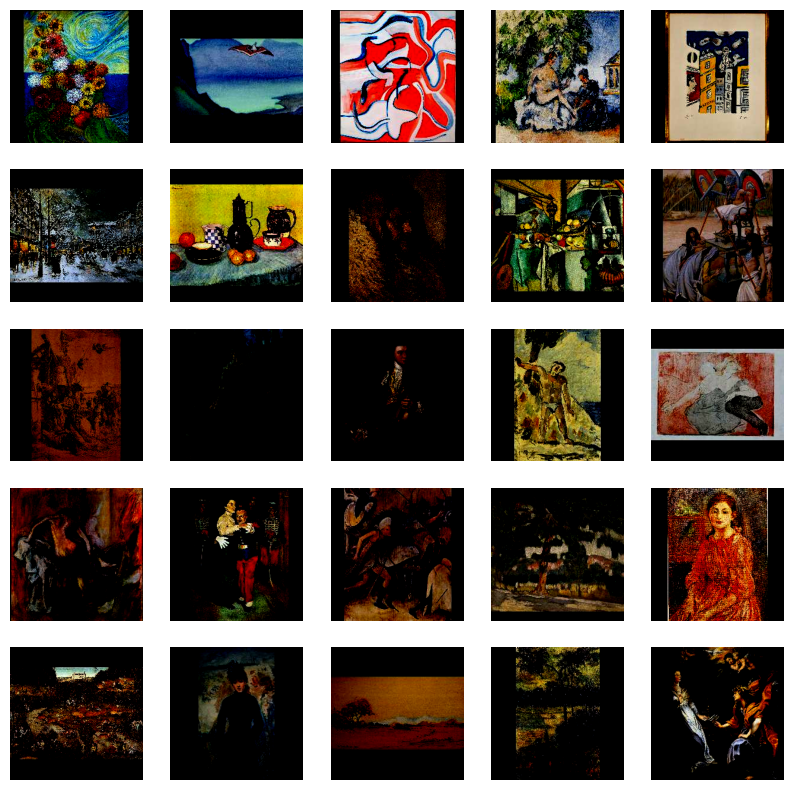

#### 1.2 Model Architecture

In [11]:
#### architecture diagram 

In [ ]:
class StyleResNet50_5(nn.Module):
  def __init__(self, hidden_dim1=1024, hidden_dim2=256):
    super(StyleResNet50_5, self).__init__()

    resnet = models.resnet50(pretrained=True)
    self.resnet_features = nn.Sequential(*list(resnet.children())[:-1])

    self.fc1 = nn.Linear(2048, hidden_dim1)
    self.fc2 = nn.Linear(hidden_dim1, hidden_dim2)
    self.fc3 = nn.Linear(hidden_dim2, 13)
    self.dropout = nn.Dropout(p=0.5)
    self.flatten = nn.Flatten()
    self.leaky_relu = nn.LeakyReLU(negative_slope=0.1, inplace=True)


  def forward(self, x):
    x = self.resnet_features(x)
    x = self.flatten(x)
    x = self.dropout(x)
    x = self.leaky_relu(self.fc1(x))
    x = self.dropout(x)
    x = self.leaky_relu(self.fc2(x))
    x = self.dropout(x)
    x = self.fc3(x)

    return x

#### 1.3 Training

Training code is as follows. Every epoch took about 10 minutes in colab environment. 

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"device: {device}")

In [ ]:
def train_model(model, model_name, train_loader, valid_loader, device, save_dir, num_epochs=4, lr=0.0001, wd=0, clip_gradient=None):
    train_losses = []
    valid_losses = []
    train_accuracies = []
    valid_accuracies = []
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    model.train()

    optimizer = Adam(model.parameters(), lr=lr, weight_decay=wd)
    criterion = nn.CrossEntropyLoss()

    start_time = time.time()
    for epoch in range(num_epochs):

        running_loss = 0.0
        running_pred = 0.0
        running_total = 0.0
        tqdm_bar = tqdm(train_loader)

        for batch_idx, (inputs, labels) in enumerate(tqdm_bar):
            with torch.set_grad_enabled(True):
                inputs, labels = inputs.to(device), labels.to(device)
                optimizer.zero_grad()
                outputs = model(inputs)
                loss = criterion(outputs, labels)

                loss.backward()
                if clip_gradient is not None:
                    torch.nn.utils.clip_grad_norm_(model.parameters(), clip_gradient)
                optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                pred = outputs.max(1, keepdim=True)[1]
                running_pred += pred.eq(labels.view_as(pred)).sum().item()
                running_total += pred.shape[0]


        train_acc = running_pred / running_total
        train_loss = running_loss / running_total
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)
        running_loss = 0.0
        running_pred = 0.0
        running_total = 0.0
        valid_loss, valid_acc = evaluate_model(model, valid_loader, device)
        valid_losses.append(valid_loss)
        valid_accuracies.append(valid_acc)
        print(f'Epoch [{epoch+1}/{num_epochs}], Step [{batch_idx+1}/{len(train_loader)}], '
              f'Training Loss: {train_loss:.4f}, Training Accuracy: {train_acc:.4f}, '
              f'Validation Loss: {valid_loss:.4f}, Validation Accuracy: {valid_acc:.4f}')
        model.train()

        joblib.dump(model, f'{save_dir}{model_name}_epoch{epoch+1}.joblib')

        results = pd.DataFrame({'train loss': train_losses, 'valid loss': valid_losses, 'train accuracy': train_accuracies, 'valid accuracy': valid_accuracies})
        results.to_csv(f'{save_dir}{model_name}_results.csv')
    end_time = time.time()
    elapsed_time = end_time - start_time
    plot_curves(train_losses, valid_losses, train_accuracies, valid_accuracies, elapsed_time)


    return model, train_losses, valid_losses, train_accuracies, valid_accuracies

Additional utility function are as given below

In [ ]:
def plot_curves(train_losses, valid_losses, train_accuracies, valid_accuracies, elapsed_time):
    print(f'elapsed time: {elapsed_time}')
    iterations = range(1, len(train_losses) + 1)
    # Plot Loss Curve
    plt.figure(figsize=(10, 5))
    plt.plot(iterations, train_losses, label='Train Loss', color='blue')
    plt.plot(iterations, valid_losses, label='Validation Loss', color='orange')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.grid(True)
    plt.show()
    epochs = range(1, len(train_accuracies) + 1)
    # Plot Accuracy Curve
    plt.figure(figsize=(10, 5))
    plt.plot(epochs, train_accuracies, label='Train Accuracy', color='blue')
    plt.plot(epochs, valid_accuracies, label='Validation Accuracy', color='orange')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()
    plt.grid(True)
    plt.show()

In [ ]:
def evaluate_model(model, data_loader, device):
    model.eval()  # Set the model to evaluation mode
    total_loss = 0.0
    total_correct = 0
    total_samples = 0

    criterion = nn.CrossEntropyLoss()
    with torch.no_grad():
        for data, labels in data_loader:
          data, labels = data.to(device), labels.to(device)
          output = model(data)
          loss = criterion(output, labels)
          total_loss += loss.item() * data.size(0)
          pred = output.max(1, keepdim=True)[1]
          total_correct += pred.eq(labels.view_as(pred)).sum().item()
          total_samples += data.size(0)

    accuracy = total_correct / total_samples
    average_loss = total_loss / total_samples

    return average_loss, accuracy

#### 1.4 Results

After various hyperparameter tuning and modification of last fully connected layers, given architecture explained in 1.3 with learning rate 0.00001, clip gradient 1.0 and epoch 4 was selected as the best model. The training curve is given as below. 

In [ ]:
model = StyleResNet50_5()
trained_model, train_losses, valid_losses, train_accuracies, valid_accuracies = train_model(model, 'model_50_5', train_loader, val_loader, device, save_dir, num_epochs = 5, clip_gradient=1.0)

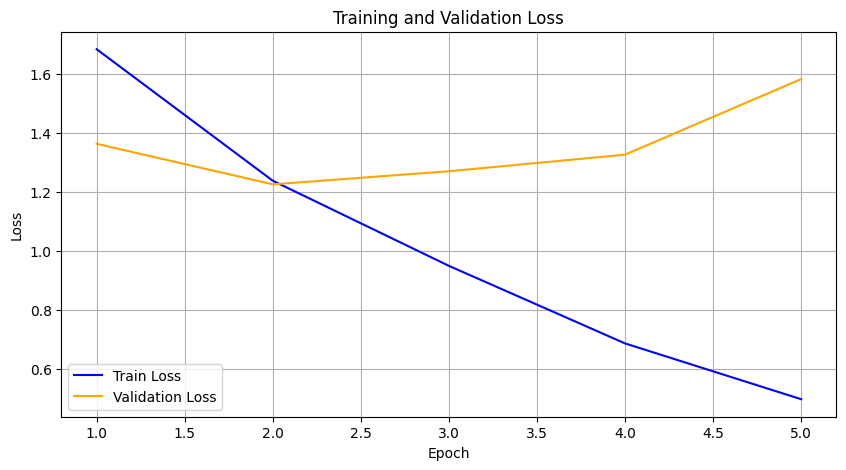
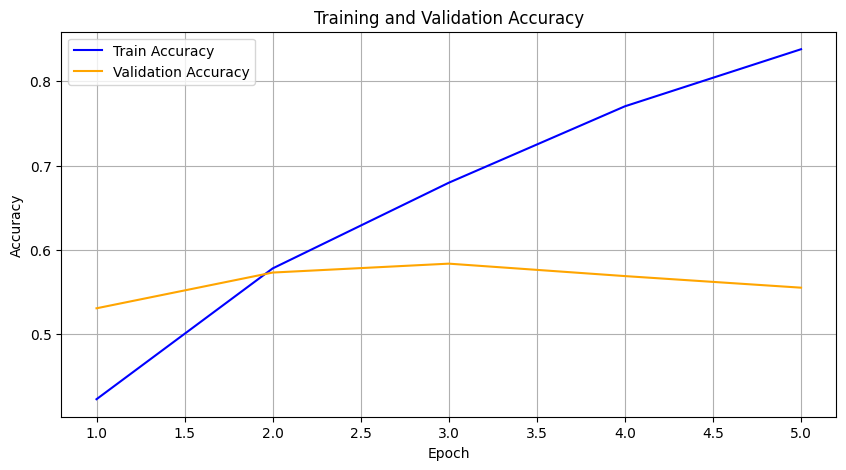

As can be seen with the training curves, the train accuracy goes up to 80% but the validation and test accuracy is quite low, reaching 58% for the maximum. We introduced a new metric top-3-accuracy to evaluate the model performance. Top-3-accuracy computes the number of times where the correct label is among the top 3 labels predicted. Since there are similar styles and styles which overlap, top-3-accuracy can be a reasonable metric to evaluate the style classification. With top-3-accuracy, the trained model exhibits a reasonably good performance. 

In [4]:
losses = pd.read_csv('style_cnn_kaccuracy.csv', index_col=0) 
losses

,losses,accuracy,k accuracy
train,0.588948,0.803671,0.962333
val,1.270694,0.583623,0.865307
test,1.270794,0.587444,0.862867



To further validate the suitability of top-k-accuracy as a metric, we analyzed the probability distribution of the top predictions for images that were misclassified but still contained the true label within the top 3 predictions. The analysis revealed that the misclassified probability hovered around 50%, indicating that even in cases of misclassification, the correct label still often have a relatively high probability among the top predictions.

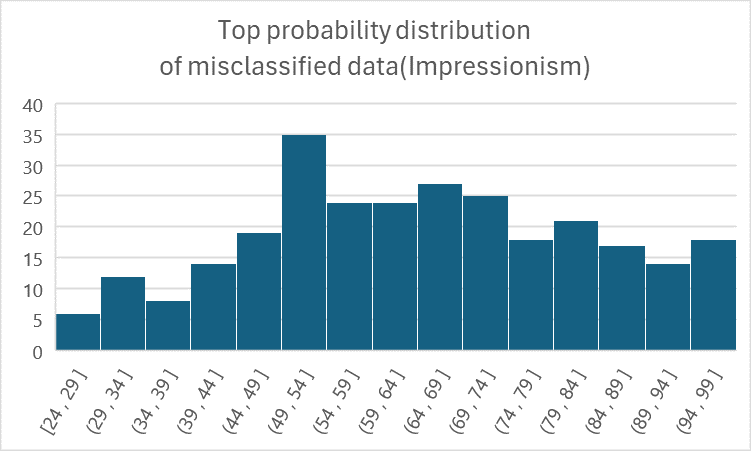

The analysis of precision, recall, and F1 score reveals that post-impressionism, expressionism, and symbolism exhibit the lowest F1 scores for the validation set. This outcome primarily stems from the model's tendency to misclassify a significant portion of expressionism images as post-impressionism. This result is understandable given the similarities between post-impressionism and expressionism, both of which often feature bold colors and dynamic brushwork, as exemplified in the provided example. Furthermore, the categorization of symbolism as an art movement rather than a consistent style leads to varied predictions across different styles, contributing to the low F1 score.

In [2]:
precision_metrics = pd.read_csv('style_cnn_precision_metrics.csv', index_col=0) 
precision_metrics

,train precision,val precision,test precision,train recall,val recall,test recall,train f1,val f1,test f1
Abstract_Expressionism,0.828008,0.609195,0.662069,0.942947,0.770909,0.683274,0.881748,0.680578,0.672504
Art_Nouveau_Modern,0.826470,0.630178,0.625668,0.758074,0.514493,0.528217,0.790796,0.566489,0.572827
Baroque,0.865530,0.645161,0.643172,0.909251,0.668258,0.703614,0.886852,0.656506,0.672037
Cubism,0.877181,0.712418,0.750000,0.742614,0.473913,0.502041,0.804308,0.569191,0.601467
Expressionism,0.780848,0.501859,0.478689,0.695853,0.397644,0.445802,0.735904,0.443714,0.461660
Impressionism,0.845899,0.680534,0.694570,0.832359,0.676287,0.685778,0.839074,0.678404,0.690146
Naive_Art_Primitivism,0.843149,0.626667,0.662252,0.696721,0.417778,0.452489,0.762973,0.501333,0.537634
Northern_Renaissance,0.932958,0.802326,0.795122,0.908774,0.736655,0.654618,0.920707,0.768089,0.718062
Post_Impressionism,0.639342,0.434426,0.398524,0.756606,0.566412,0.533773,0.693048,0.491716,0.456338
Realism,0.748386,0.514844,0.523988,0.864515,0.660781,0.651445,0.802270,0.578755,0.580806


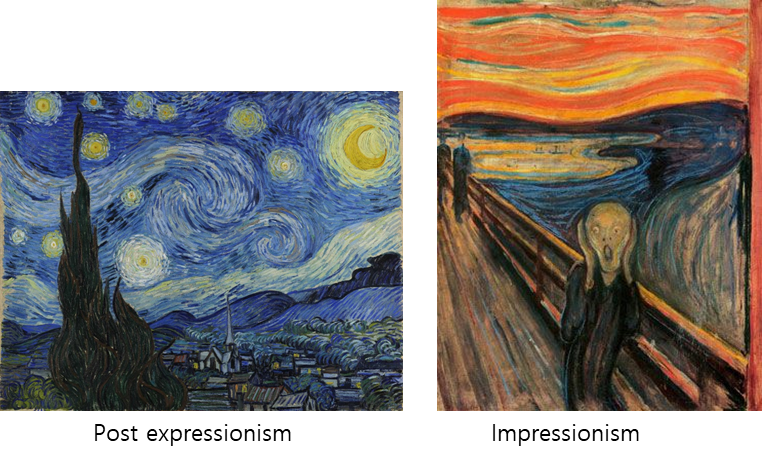

#### 1.5 Implementation on new data

In [ ]:
### visualize on new data --- probably style, genre, and similarity at once? 

#### 1.6 Image Segmentation

In [14]:
#### image segmentation advantage(reported by literature)..... 
# results

### 2. Genre Classification Model

### 3. Artwork Recommender

#### 3.1 Import dataset and Train

In order to recommend the image with detailed description that are similar to the given art pieces, the team leverage Semart dataset. 

In [ ]:
# Adjust the paths to where your datasets are located
train_df = pd.read_csv('./SemArt/semart_test.csv', sep='\t', encoding='ISO-8859-1')
val_df = pd.read_csv('./SemArt/semart_val.csv', sep='\t', encoding='ISO-8859-1')
test_df = pd.read_csv('./SemArt/semart_test.csv', sep='\t', encoding='ISO-8859-1')

In [ ]:
all_data_df = pd.concat([train_df, val_df, test_df], ignore_index=True)

In [ ]:
all_data_df

,IMAGE_FILE,DESCRIPTION,AUTHOR,TITLE,TECHNIQUE,DATE,TYPE,SCHOOL,TIMEFRAME
0,41294-10ladisl.jpg,Of the Hungarian kings St Ladislas is perhaps ...,"UNKNOWN MASTER, Hungarian","Saint Ladislaus, King of Hungary","Oil on wood, 103 x 101,3 cm",c. 1600,religious,Hungarian,1551-1600
1,42791-1sacris.jpg,This ceiling painting in the sacristy of San S...,"VERONESE, Paolo",Coronation of the Virgin,"Oil on canvas, 200 x 170 cm",1555,religious,Italian,1551-1600
2,14376-worship.jpg,In the same period when the most talented arti...,"FRANCKEN, Frans II",Worship of the Golden Calf,"Oil on panel, 60 x 88 cm",-,religious,Flemish,1601-1650
3,24776-annuncia.jpg,Based on its style the Annunciation is attribu...,MASTER of Flémalle,Annunciation,"Tempera on oak, 61 x 63,7 cm",1420s,religious,Flemish,1401-1450
4,23845-3manet04.jpg,The 1870s were rich in female models for Manet...,"MANET, Edouard",Brunette with Bare Breasts,"Oil on canvas, 60 x 49 cm",c. 1872,portrait,French,1851-1900
...,...,...,...,...,...,...,...,...,...
3202,08082-gondola.jpg,In this painting Carus also shows the figures ...,"CARUS, Carl Gustav",A Gondola on the Elbe near Dresden,"Oil on canvas, 29 x 22 cm",1827,landscape,German,1801-1850
3203,32349-17ignazi.jpg,The effect of the simulated cupola rests large...,"POZZO, Andrea",Painting on the pendentive: Samson,Fresco,1685,religious,Italian,1651-1700
3204,35839-valkhof1.jpg,The picture shows the Valkhof at Nijmegen with...,"RUYSDAEL, Salomon van",The Valkhof at Nijmegen,"Oil on canvas, 73 x 103 cm",1650s,landscape,Dutch,1601-1650
3205,40789-crucifix.jpg,This unusually violent Crucifix was probably t...,"UNKNOWN MASTER, Bohemian",Crucifixion,"Panel, 67 x 30 cm",c. 1360,religious,Bohemian,1351-1400


In [ ]:
all_data_df.to_csv("./SemArt/semart_desc_all.csv", index=False, sep='\t', encoding='utf-8')

In [ ]:
all_data_df.iloc[0]['IMAGE_FILE']

'41294-10ladisl.jpg'

Train code

In [ ]:
class AttrDict(dict):
    def __init__(self, *args, **kwargs):
        super(AttrDict, self).__init__(*args, **kwargs)
        self.__dict__ = self

def train(args, gen=None):

    # Numpy random seed
    npr.seed(args.seed)

    # Save directory
    save_dir = "outputs/" + args.experiment_name

    # LOAD THE MODEL
    if gen is None:
        Net = globals()[args.model]
        gen = Net(args.kernel, args.num_filters)

    # LOSS FUNCTION
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(gen.parameters(), lr=args.learn_rate)

    # DATA
    print("Loading data...")
    _, train_loader, _, _, _ = cd.get_data_loader("./SemArt/all_image",batch_size=args.batch_size,resize=args.resize)

    #print("Transforming data...")
    #train_rgb, train_grey = process(x_train, y_train, downsize_input=args.downsize_input)
    #test_rgb, test_grey = process(x_test, y_test, downsize_input=args.downsize_input)

    # Create the outputs folder if not created already
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    print("Beginning training ...")
    if args.gpu:
        gen.cuda()

    for epoch in range(args.epochs):
        # Train the Model
        gen.train()  # Change model to 'train' mode
        losses = []
        for i, data in enumerate(train_loader,0):
            inputs, _,_,_= data

            #############################################
            #To Enable GPU Usage
            if torch.cuda.is_available():
              inputs = inputs.cuda()
            #############################################

            # Forward + Backward + Optimize
            optimizer.zero_grad()
            outputs = gen(inputs)

            loss = criterion(outputs, inputs)
            loss.backward()
            optimizer.step()
            losses.append(loss.data.item())

        print(epoch, loss.cpu().detach())
        #if epoch%5 == 0 and args.plot:
        visualize(inputs, outputs, args.gpu, 1)
        # Save the model state dictionary
        model_save_path = os.path.join(save_dir, f'model_epoch_{epoch}.pth')
        torch.save(gen.state_dict(), model_save_path)

    return gen

#### 3.2 Model Architecture

In order to extract the encoder from the Autoencoder I will try to have two separate class to edfine encoder and decoder. Then another class to assemble this structure. As I discuss with professor lot of skip connection mmight be useful for regeneration but this may not necessarily translate into better feature space. so I will use just one skip connection at the start of the decoder this has helped the autoencoder to be good but still don't have too much hint.

In [ ]:
class UNetEncoder(nn.Module):
    def __init__(self, kernel, num_filters, num_in_channels=3):
        super(UNetEncoder, self).__init__()
        stride = 2
        padding = kernel // 2

        self.downconv1 = nn.Sequential(
            nn.Conv2d(num_in_channels, num_filters, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(num_filters),
            nn.ReLU(),
            nn.MaxPool2d(2))
        
        self.downconv2 = nn.Sequential(
            nn.Conv2d(num_filters, num_filters*2, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(num_filters*2),
            nn.ReLU(),
            nn.MaxPool2d(2))
        
        self.downconv3 = nn.Sequential(
            nn.Conv2d(num_filters*2, num_filters*4, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(num_filters*4),
            nn.ReLU(),
            nn.MaxPool2d(2)
            )
        
        self.rfconv = nn.Sequential(
            nn.Conv2d(num_filters*4, num_filters*4, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(num_filters*4),
            nn.ReLU())

    def forward(self, x):
        x1 = self.downconv1(x)
        x2 = self.downconv2(x1)
        x3 = self.downconv3(x2)
        x_rf = self.rfconv(x3)
        return x1, x2, x3, x_rf


In [ ]:
class UNetDecoder_simp(nn.Module):
    def __init__(self, kernel, num_filters, num_colours=3, num_in_channels=3):
        super(UNetDecoder_simp, self).__init__()
        padding = kernel // 2

        self.upconv1 = nn.Sequential(
            nn.ConvTranspose2d(num_filters*4, num_filters*2, kernel_size=kernel, stride=2, padding=padding, output_padding=1),
            nn.BatchNorm2d(num_filters*2),
            nn.ReLU())

        self.upconv2 = nn.Sequential(
            nn.ConvTranspose2d(num_filters*4, num_filters, kernel_size=kernel, stride=2, padding=padding, output_padding=1),
            nn.BatchNorm2d(num_filters),
            nn.ReLU())

        self.upconv3 = nn.Sequential(
            nn.ConvTranspose2d(num_filters, num_filters, kernel_size=kernel, stride=2, padding=padding, output_padding=1),
            nn.BatchNorm2d(num_filters),
            nn.ReLU())

        self.finalconv = nn.Conv2d(num_filters, num_colours, kernel_size=kernel, padding=padding)

    def forward(self, x1, x2, x3, x_rf, original_x):
        x_up1 = self.upconv1(x_rf)
        x_up1_skip = torch.cat([x_up1, x2], dim=1)
        x_up2 = self.upconv2(x_up1_skip)
        x_up3 = self.upconv3(x_up2)
        out = self.finalconv(x_up3)
        return out


In [ ]:
class UNet_simp(nn.Module):
    def __init__(self, kernel, num_filters, num_colours=3, num_in_channels=3):
        super(UNet_simp, self).__init__()
        self.encoder = UNetEncoder(kernel, num_filters, num_in_channels)
        self.decoder = UNetDecoder_simp(kernel, num_filters, num_colours, num_in_channels)

    def forward(self, x):
        x1, x2, x3, x_rf = self.encoder(x)
        out = self.decoder(x1, x2, x3, x_rf, x)
        return out


This is one of the instance of the training model. Due to computatioanl limitation minimal hyperparameter tuning was done.
mostly decreasing model complexity to overcome overfitting. 

Loading data...
Beginning training ...
0 tensor(0.0037)


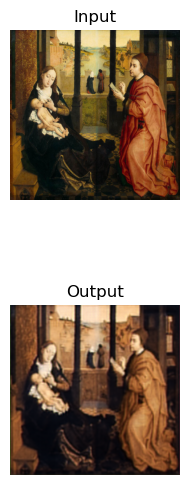

1 tensor(0.0051)


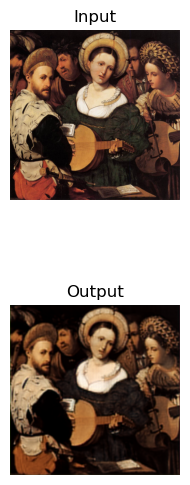

2 tensor(0.0026)


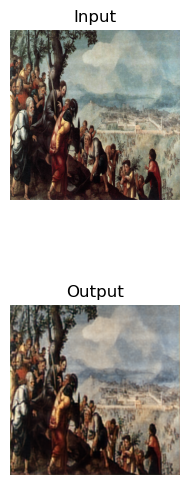

In [ ]:
# Total training time 102min
args_dict = {
    "gpu": True,
    "valid": False,
    "checkpoint": "",
    "model": "UNet_simp",
    "kernel": 5,
    "num_filters": 10,
    'learn_rate':0.01,
    "batch_size": 64,
    "epochs": 3,
    "seed": 0,
    "resize": transforms.Resize((512,512)),
    "plot": True,
    "experiment_name": "UNet_SEMART",
    "visualize": False,
    "downsize_input": False,
}

#### 3.3 Using art recommendation system

##### 3.3.1 Load models

Kmeans, Unet, and embeddings

In [ ]:
import pickle

# Replace 'your_file.pkl' with the path to your pickle file
pickle_file_path = './outputs/encoded_features_desc_w_Cluster_unique.pkl'

with open(pickle_file_path, 'rb') as file:
    data = pickle.load(file)

df_cluster = pd.DataFrame(data)

In [ ]:
from joblib import dump, load

# Assuming `kmeans` is your trained KMeans model
model_filename = './outputs/kmeans_model.joblib'
kmeans = load(model_filename)

In [ ]:
_, train_loader_wiki, val_loader_wiki, test_loader_wiki, _ = cd.get_data_loader("./wikiART224",resize=transforms.Resize((224,224)),batch_size=1,normailze = True)
print('training examples: ',len(train_loader_wiki))
print('validation examples: ',len(val_loader_wiki))
print('testing examples: ', len(test_loader_wiki))

training examples:  65153
validation examples:  8144
testing examples:  8145


In [ ]:
df_cluster

,IMAGE_FILE,DESCRIPTION,AUTHOR,TITLE,TECHNIQUE,DATE,TYPE,SCHOOL,TIMEFRAME,Encoded Features,Cluster
0,41294-10ladisl.jpg,Of the Hungarian kings St Ladislas is perhaps ...,"UNKNOWN MASTER, Hungarian","Saint Ladislaus, King of Hungary","Oil on wood, 103 x 101,3 cm",c. 1600,religious,Hungarian,1551-1600,"[0.66586727, 0.51203525, 0.0, 0.0, 0.0, 0.0, 0...",0
1,42791-1sacris.jpg,This ceiling painting in the sacristy of San S...,"VERONESE, Paolo",Coronation of the Virgin,"Oil on canvas, 200 x 170 cm",1555,religious,Italian,1551-1600,"[0.4588764, 0.31383383, 0.30628043, 0.316805, ...",10
2,14376-worship.jpg,In the same period when the most talented arti...,"FRANCKEN, Frans II",Worship of the Golden Calf,"Oil on panel, 60 x 88 cm",-,religious,Flemish,1601-1650,"[0.45856556, 0.32140628, 0.31562173, 0.3044343...",10
3,24776-annuncia.jpg,Based on its style the Annunciation is attribu...,MASTER of Flémalle,Annunciation,"Tempera on oak, 61 x 63,7 cm",1420s,religious,Flemish,1401-1450,"[0.0, 0.0, 0.0, 0.33191314, 0.44521868, 0.7014...",6
4,23845-3manet04.jpg,The 1870s were rich in female models for Manet...,"MANET, Edouard",Brunette with Bare Breasts,"Oil on canvas, 60 x 49 cm",c. 1872,portrait,French,1851-1900,"[0.61417955, 0.56172717, 0.60303986, 0.5860305...",4
...,...,...,...,...,...,...,...,...,...,...,...
2133,28424-winter.jpg,This signed painting depicts a winter landscap...,"MOLENAER, Klaes",Winter Landscape,"Oil on oak panel, 39 x 33 cm",-,landscape,Dutch,1651-1700,"[0.75753313, 0.62387294, 0.5723128, 0.4696973,...",8
2134,14184-08bolt.jpg,"At first sight, this painting describing the f...","FRAGONARD, Jean-Honoré",The Bolt,"Oil on canvas, 73 x 93 cm",c. 1777,genre,French,1751-1800,"[0.5883344, 0.5935383, 0.6462424, 0.6168197, 0...",5
2135,19609-nordlin1.jpg,This is the outside right wing of the high alt...,"HERLIN, Friedrich",Family of the Founder Jakob Fuchsart,"Wood, 89 x 66 cm",1462-65,religious,German,1451-1500,"[0.5969873, 0.53667825, 0.6016903, 0.6184438, ...",11
2136,35406-08assum.jpg,The Antwerp Cathedral was given a new marble h...,"RUBENS, Peter Paul",Assumption of the Virgin,"Oil on panel, 490 x 325 cm",1626,religious,Flemish,1601-1650,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",19


In [ ]:
from scipy.spatial.distance import cdist


model_unet = UNet_simp(kernel=3, num_filters=32, num_colours=3, num_in_channels=3)
# Ensure you're loading the model on the correct device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the state dictionary
model_state_dict = torch.load('./outputs/UNet_SEMART/model_epoch_2.pth', map_location=device)

# Update the model with the loaded state dictionary
model_unet.load_state_dict(model_state_dict)

<All keys matched successfully>

##### 3.3.2 Get Helper code

To do this first I have to clusternew image to get the cluster. Get the cluster and compare point within that cluster then get the closest three.

In [ ]:
def get_top_similar_file(new_point):
    cluster_label = kmeans.predict(new_point)[0]
    
    # Extract points belonging to the same cluster as the new point
    #same_cluster_indices = np.where(labels == cluster_label)[0]
    same_cluster_df = df_cluster[df_cluster["Cluster"] == cluster_label]
    # Assuming encoded features are stored as lists; convert them to numpy arrays
    cluster_encoded_features = np.stack(same_cluster_df['Encoded Features'].values)

    # Calculate distances from the new point to each point in the same cluster
    distances = cdist(new_point.reshape(1, -1), cluster_encoded_features, metric='cosine').flatten()

    # Get the indices of the top 3 smallest distances
    top_3_indices = distances.argsort()[:3]

    # Retrieve relevant information for the top 3 closest points
    top_3_info = same_cluster_df.iloc[top_3_indices]

    print("Top 3 similar images to the new point are:", top_3_info["IMAGE_FILE"])

    return top_3_info["IMAGE_FILE"],top_3_info

In [ ]:
def encode_image(img,model):
    if torch.cuda.is_available():
        inputs = img.cuda()
        model = model.cuda()

    with torch.no_grad():  # Ensuring no gradients are computed
        outputs = model.encoder(inputs)

    vec = outputs[-1]  # This selects the last tensor from the tuple
    # Flatten the selected tensor to 1D and move it to CPU
    vec = vec.view(vec.size(0), -1).cpu().numpy()
    return vec

In [ ]:
def find_and_display_image(image_file_name, search_directory = "./SemArt/all_image/Images"):
    """
    Searches for an image file in the specified directory and its subdirectories,
    and displays the image if found.
    
    Parameters:
    - image_file_name: The name of the image file to find (e.g., 'example.jpg').
    - search_directory: The root directory to start the search from.
    """
    found = False
    
    # Walk through all directories and files within the search directory
    for root, dirs, files in os.walk(search_directory):
        if image_file_name in files:
            # Construct the full path to the image
            image_path = os.path.join(root, image_file_name)
            print(f"Image found: {image_path}")
            
            # Load and display the image
            img = Image.open(image_path)
            plt.imshow(img)
            plt.axis('off')  # Hide axes
            plt.show()
            
            found = True
            break  # Exit the loop once the image is found and displayed
    
    if not found:
        print("Image not found.")

##### 3.3.3 Using this system

Example of implementation on new data. This autoencoder was trained with semart to get description. So later cell will be showing use cases for the wikiart data. This code below will recommend top 3 image that are similar and its description.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


================0=================
Image Input to claude-monet_poplars-on-the-banks-of-the-river-epte-seen-from-the-marsh-1892.jpg


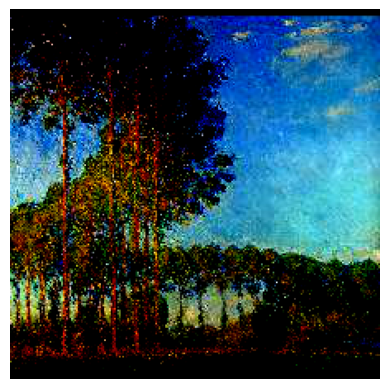

Top 3 similar images to the new point are: 527     04775-landsca2.jpg
169     21079-birchtre.jpg
1728    04486-river_la.jpg
Name: IMAGE_FILE, dtype: object
              IMAGE_FILE                                        DESCRIPTION  \
527   04775-landsca2.jpg  This painting is the pendant of the Landscape ...   
169   21079-birchtre.jpg  Klodt is considered to be a major figure in Ru...   
1728  04486-river_la.jpg  The painting shows a river landscape with fish...   

                              AUTHOR                  TITLE  \
527           BLOEMEN, Jan Frans van      Italian Landscape   
169   KLODT, Mikhail Konstantinovich  Under the Birch Trees   
1728            BEYEREN, Abraham van        River Landscape   

                      TECHNIQUE     DATE       TYPE   SCHOOL  TIMEFRAME  \
527   Oil on canvas, 48 x 38 cm  c. 1735  landscape  Flemish  1651-1700   
169   Oil on canvas, 27 x 48 cm     1874  landscape  Russian  1851-1900   
1728   Oil on panel, 61 x 94 cm        -  landsca

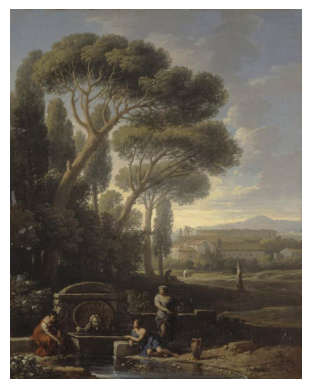

Image found: ./SemArt/all_image/Images\21079-birchtre.jpg


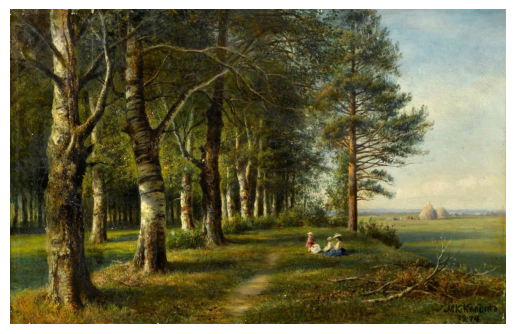

Image found: ./SemArt/all_image/Images\04486-river_la.jpg


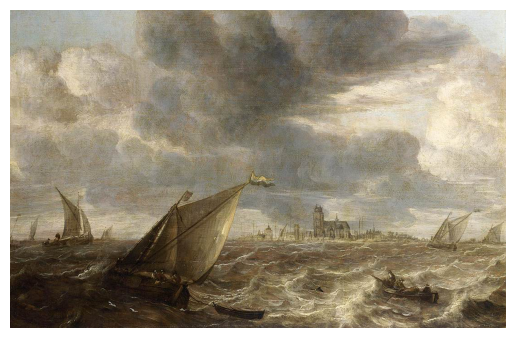

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


================1=================
Image Input to gregoire-boonzaier_district-six-1.jpg


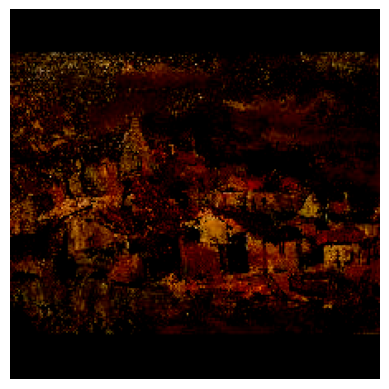

Top 3 similar images to the new point are: 1011    00813-marco_p3.jpg
1630      44746-silver.jpg
264      21928-6carnat.jpg
Name: IMAGE_FILE, dtype: object
              IMAGE_FILE                                        DESCRIPTION  \
1011  00813-marco_p3.jpg  This picture is the second from the left on th...   
1630    44746-silver.jpg  This small painting from Villa Medici in Rome ...   
264    21928-6carnat.jpg  A work that would seem to evoke the sketches o...   

                 AUTHOR                                   TITLE  \
1011      ANGELICO, Fra  Saint Cosmas and Saint Damian Salvaged   
1630     ZUCCHI, Jacopo                           Age of Silver   
264   LEONARDO da Vinci            The Madonna of the Carnation   

                                  TECHNIQUE     DATE          TYPE   SCHOOL  \
1011  Tempera and gold on panel, 38 x 45 cm  1438-40     religious  Italian   
1630                Oil on wood, 50 x 39 cm  c. 1587  mythological  Italian   
264              Oil 

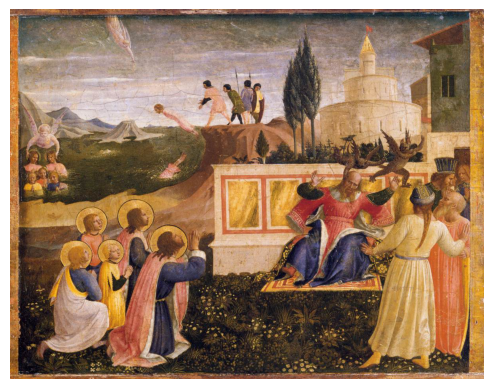

Image found: ./SemArt/all_image/Images\44746-silver.jpg


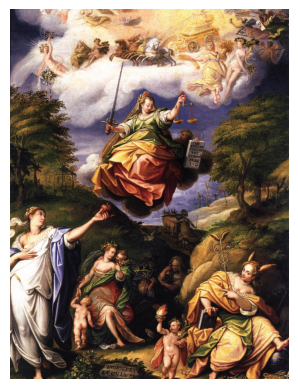

Image found: ./SemArt/all_image/Images\21928-6carnat.jpg


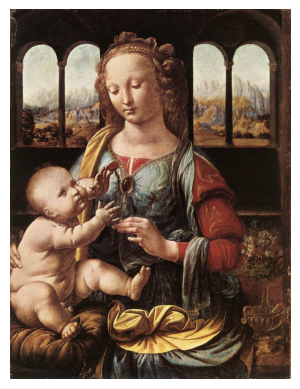

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


================2=================
Image Input to ivan-shishkin_forest-stream-2.jpg


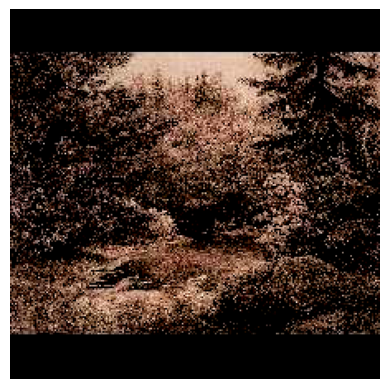

Top 3 similar images to the new point are: 1699    21402-woodedla.jpg
781       28588-paris5.jpg
1227    25344-adoratio.jpg
Name: IMAGE_FILE, dtype: object
              IMAGE_FILE                                        DESCRIPTION  \
1699  21402-woodedla.jpg  The picture shows a wooded landscape with figu...   
781     28588-paris5.jpg  Flags were flown on 30 June, 1878, to mark the...   
1227  25344-adoratio.jpg  In this work by Mazzolino the sharpness of lin...   

                   AUTHOR                                              TITLE  \
1699      LAMBERT, George                                   Wooded Landscape   
781         MONET, Claude  Rue Montorgueil in Paris, Celebration of 30 Ju...   
1227  MAZZOLINO, Ludovico                         Adoration of the Shepherds   

                        TECHNIQUE     DATE        TYPE   SCHOOL  TIMEFRAME  \
1699    Oil on canvas, 52 x 65 cm     1725   landscape  English  1701-1750   
781     Oil on canvas, 81 x 51 cm     1878  histor

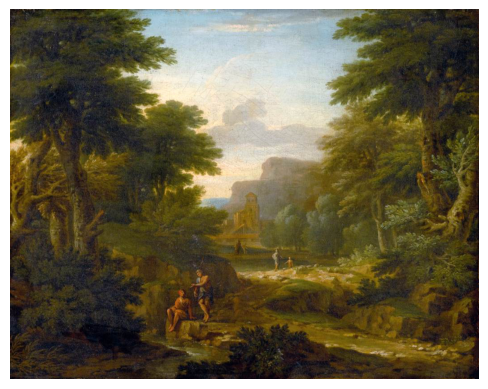

Image found: ./SemArt/all_image/Images\28588-paris5.jpg


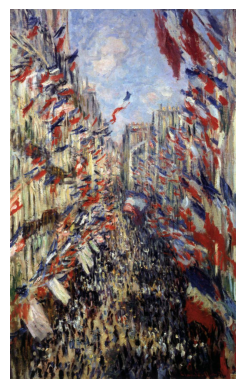

Image found: ./SemArt/all_image/Images\25344-adoratio.jpg


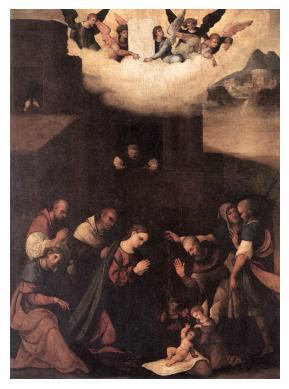

In [ ]:
counter = 0
# assuming we only input one Image where batch size  = 1
for images, labels, filenames, sublabels in test_loader_wiki:
    print(f"================{counter}=================")
    print(f"Image Input to {filenames[0]}")
    # Rearrange the axes from (1, 3, 224, 224) to (224, 224, 3)
    img = np.transpose(images, (0, 2, 3, 1)).squeeze(0)

    # Display the image
    plt.imshow(img)
    plt.axis('off')  # Optionally remove the axis
    plt.show()

    emb = encode_image(images,model_unet)
    top_3_filenames, infos = get_top_similar_file(emb)
    print(infos)
    for fn in top_3_filenames:
        find_and_display_image(fn)
    if counter == 2:
        break
    counter +=1

The model I can say is mixed performance first K means clustering seems to be working great. If you see the top 3 images seem to be very similar so it has captured meaningful things. The autoencoder that embedded the new test data was a bit underperforming but this is understandable since the variation of training data was hugely different and autoencoders do have trouble when they do tasks on unseen data. If the given dataset was large it would be better since, especially for old art pieces overfitting is also more susceptible since there will be no new image created.